<a href="https://colab.research.google.com/github/shay-dan/DS_workshop_OpenUIL/blob/main/Prediction_Object_Detection_Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#6.2.Object Detection

Now that we have seen how our models are doing for classification, let's move to object detection. we are going to use Detectron2 and YOLOv8.

We start with Detectron2. Information about the model can be found on chapter 6 - presentation of the models.

##Detectron2:

In [ ]:
# necessary installs
import os
import sys
import distutils.core
import logging
import shutil
import glob
import json
import requests
import random

import torch
import cv2
import yaml

# we install from META github repository
!python -m pip install pyyaml==5.1

!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")

!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

logging.getLogger().setLevel(logging.CRITICAL)
!pip install pylabel > /dev/null

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 2.0 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15359, done.
remote: Counting objects: 100% (84/84), done.
remote: Compressing objects: 100% (70/70), done.
remote: Total 15359 (delta 31), reused 38 (delta 14), pack-reused 15275
Receiving objects: 100% (15359/15359), 6.23 MiB | 16.53 MiB/s, done.
Resolving deltas: 100% (11142/11142), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 358.7 kB/s eta 0:00:00


In [ ]:
import detectron2
import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())
import sys

!{sys.executable} -m pip install opencv-python matplotlib


PyTorch version: 2.1.0+cu121
Torchvision version: 0.16.0+cu121
CUDA is available: True


In [ ]:
import numpy as np
from matplotlib import pyplot as plt
from skimage.measure import regionprops, label
from google.colab.patches import cv2_imshow
from pylabel import importer

In [ ]:
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.logger import setup_logger

In [ ]:
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.1 ; cuda:  cu121
detectron2: 0.6


In [ ]:
# Setup detectron2 logger
setup_logger()

<Logger detectron2 (DEBUG)>

After all the imports, we start by updating the json files so that all our jsons will be consistent w.r.t

{ class : id }  with our augmented data, so we could register it for the model:

In [ ]:
#this func is to make train/val/test all have same cls:idx
def update_jsons(cls_to_id_new, to_update_path_to_json):

  cls_to_id_old = get_cls_to_id("/content/drive/MyDrive/dataset_augmented/val/Val.json")

  with open(to_update_path_to_json) as f:
    data = json.load(f)

  out_file = open(to_update_path_to_json, "w")

  for i, item in enumerate(data["categories"]):
    item["id"] = list(cls_to_id_new.values())[i]
    item["name"] = list(cls_to_id_new.keys())[i]

  for item in data["images"]:
    idx = item["id"]
    tmp = item["file_name"].split("0")[0]
    r = tmp.split("_")[-1]
    # print(item["file_name"], tmp, r, idx)
    if tmp == "mix":
      for ann in data["annotations"]:
        if ann["image_id"] == idx:
          for key,value in cls_to_id_old.items():
            if ann["category_id"] == 1: # coin is always 1
              ann["category_id"] = 1
            elif ann["category_id"] == value:
              for k,v in cls_to_id_new.items():
                if key == k:
                  ann["category_id"] = list(cls_to_id.values())[v]
                  break
              break
    if r == "mix":
      print(item["file_name"], tmp, r, idx)
      for ann in data["annotations"]:
        if ann["image_id"] == idx:
          for key,value in cls_to_id_old.items():
            if ann["category_id"] == 1: # coin is always 1
              ann["category_id"] = 1
            elif ann["category_id"] == value:
              for k,v in cls_to_id_new.items():
                print(key,value,k,v)
                if key == k:
                  print("old ann[category_id] ",ann["category_id"])
                  ann["category_id"] = list(cls_to_id.values())[v]
                  print("new ann[category_id] ",ann["category_id"])
                  break
              break

    else:
      for k,v in cls_to_id_new.items():
        if r != tmp:
          if r == k:
            for ann in data["annotations"]:
              if ann["image_id"] == idx:
                if ann["category_id"] != 1: # coin is always 1
                  ann["category_id"] = v


  json.dump(data, out_file, indent = 4)
  out_file.close()


In [ ]:
def get_cls_to_id(path_to_json):

  key = []
  value = []

  with open(path_to_json) as f:
    data = json.load(f)

  for i, item in enumerate(data["categories"]):
    value.append(item["id"])
    key.append(item["name"])

  cls_to_id = dict(zip(key,value))

  return cls_to_id

In [ ]:
cls_to_id = get_cls_to_id("/content/drive/MyDrive/dataset_augmented/train/Updated_Train.json")

In [ ]:
cls_to_id

{'doughnut': 0,
 'coin': 1,
 'plum': 2,
 'orange': 3,
 'mango': 4,
 'lemon': 5,
 'fired_dough_twist': 6,
 'bread': 7,
 'mooncake': 8,
 'pear': 9,
 'litchi': 10,
 'bun': 11,
 'apple': 12,
 'banana': 13,
 'egg': 14,
 'qiwi': 15,
 'peach': 16,
 'sachima': 17,
 'tomato': 18,
 'grape': 19}

In [ ]:
update_jsons(cls_to_id,"/content/drive/MyDrive/dataset_augmented/val/Updated_Val.json")
update_jsons(cls_to_id,"/content/drive/MyDrive/dataset_augmented/test/Test.json")

Now we can register the model, i.e. prepare it for the model to upload:

In [ ]:
# register dataset splits - required by Detectron2
register_coco_instances("my_dataset_train1", {}, "/content/drive/MyDrive/dataset_augmented/train/Updated_Train.json", "/content/drive/MyDrive/dataset_augmented/train")
register_coco_instances("my_dataset_val1", {}, "/content/drive/MyDrive/dataset_augmented/val/Updated_Val.json", "/content/drive/MyDrive/dataset_augmented/val")
register_coco_instances("my_dataset_test1", {}, "/content/drive/MyDrive/dataset_augmented/test/Test.json", "/content/drive/MyDrive/dataset_augmented/test")

In [ ]:
train_metadata = MetadataCatalog.get("my_dataset_train1")
train_dataset_dicts = DatasetCatalog.get("my_dataset_train1")

In [ ]:
val_metadata = MetadataCatalog.get("my_dataset_val1")
val_dataset_dicts = DatasetCatalog.get("my_dataset_val1")

In [ ]:
test_metadata = MetadataCatalog.get("my_dataset_test1")
test_dataset_dicts = DatasetCatalog.get("my_dataset_test1")

In [ ]:
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

Let's see the images and how detectron visualizes them:

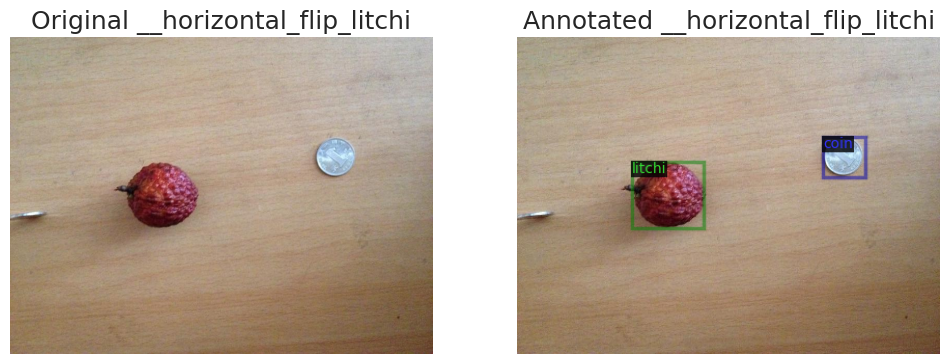

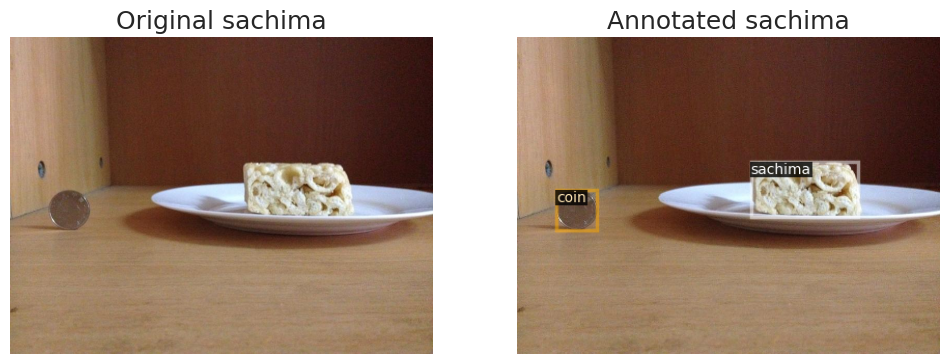

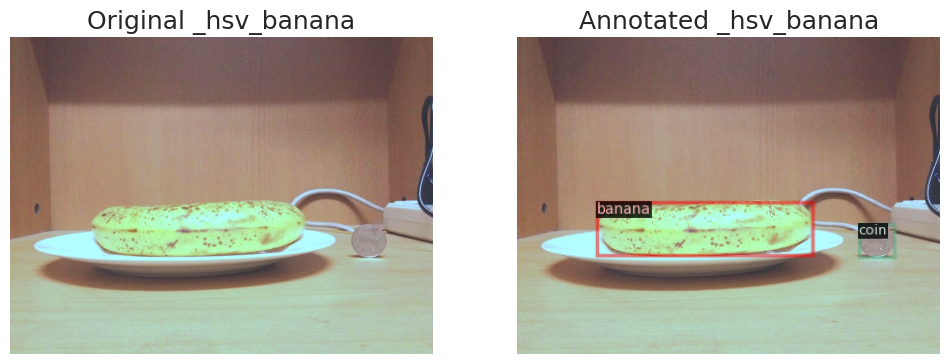

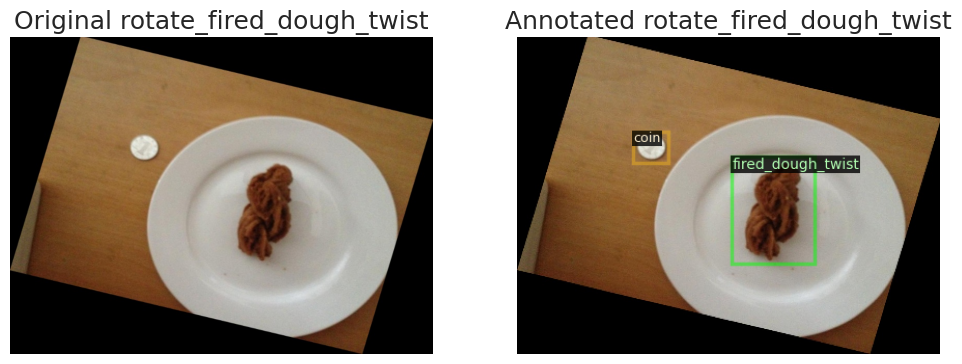

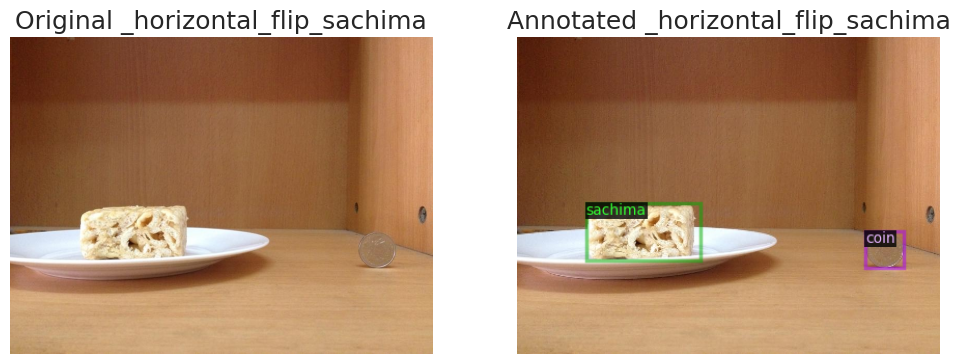

In [ ]:
# Visualize some random samples
for d in random.sample(train_dataset_dicts, 5):
    fig, axes = plt.subplots(figsize=(12,12), ncols=2, nrows=1)
    image = cv2.imread(d["file_name"])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    visualizer = Visualizer(image, metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    label = d["file_name"].split("train/")[1].split("0")[0]
    axes[0].imshow(image)
    axes[0].title.set_text('Original ' + label)
    axes[0].axis('off')

    axes[1].imshow(vis.get_image())
    axes[1].title.set_text('Annotated ' + label)
    axes[1].axis('off')
    plt.show()


The model we'll be using is:

 Detectron2 with backbone "faster_rcnn_R_50_FPN_3x", 15000 iterations, 0.00025 learning rate

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.OUTPUT_DIR = "/content/drive/MyDrive/ColabNotebooks/models/Detectron2_Models/final1"
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
# cfg.MODEL.DEVICE='cpu'
cfg.DATASETS.TRAIN = ("my_dataset_train1",)
cfg.DATASETS.TEST = ("my_dataset_val1",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 15000
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # Default is 512,
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 20  # We have 20 classes.

cfg.TEST.EVAL_PERIOD = 1500
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

We can see the model layers:

In [ ]:
trainer = CocoTrainer(cfg) #Create an instance of of DefaultTrainer with the given congiguration
trainer.resume_or_load(resume=True) #Load a pretrained model if available (resume training) or start training from scratch if no pretrained model is availabl

[02/10 15:34:39 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:01, 143MB/s]                           


Let's train!

In [ ]:
import datetime
start = datetime.datetime.now()

trainer.train() #Start the training process

end = datetime.datetime.now()
print("Total execution time of Detectron2 with 15000 iterations is: ", end-start)

[02/10 15:34:48 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[02/10 15:35:10 d2.utils.events]:  eta: 3:29:08  iter: 19  total_loss: 3.144  loss_cls: 2.825  loss_box_reg: 0.269  loss_rpn_cls: 0.004241  loss_rpn_loc: 0.004466    time: 0.8875  last_time: 0.8126  data_time: 0.4697  last_data_time: 0.3843   lr: 4.9953e-06  max_mem: 2212M
[02/10 15:35:30 d2.utils.events]:  eta: 3:28:51  iter: 39  total_loss: 2.944  loss_cls: 2.639  loss_box_reg: 0.2914  loss_rpn_cls: 0.001861  loss_rpn_loc: 0.004121    time: 0.8433  last_time: 0.9370  data_time: 0.3957  last_data_time: 0.5136   lr: 9.9902e-06  max_mem: 2212M
[02/10 15:35:48 d2.utils.events]:  eta: 3:33:07  iter: 59  total_loss: 2.463  loss_cls: 2.16  loss_box_reg: 0.3021  loss_rpn_cls: 0.002693  loss_rpn_loc: 0.005178    time: 0.8538  last_time: 0.9213  data_time: 0.5017  last_data_time: 0.4904   lr: 1.4985e-05  max_mem: 2213M
[02/10 15:36:05 d2.utils.events]:  eta: 3:36:24  iter: 79  total_loss: 1.82  loss_cls: 1.501  loss_box_reg: 0.3031  loss_rpn_cls: 0.001935  loss_rpn_loc: 0.003638    time: 0.863

KeyboardInterrupt: 

As we set val evaluation for every 1500 iterations, we can see how the model's metrics improve over time.

We can visualize our training with tensorboard:

In [ ]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/final1 --port 6008

We save the model's configuration:

In [ ]:
# Save the configuration to a config.yaml file
config_yaml_path = "/content/drive/MyDrive/ColabNotebooks/models/Detectron2_Models/final1/config.yaml"
with open(config_yaml_path, 'w') as file:
    yaml.dump(cfg, file)

Now let's see how it does:

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "/content/drive/MyDrive/ColabNotebooks/models/Detectron2_Models/final1/model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # testing threshold
predictor = DefaultPredictor(cfg)

Let's see how the model does on the validation set:

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val1", output_dir="/content/drive/MyDrive/ColabNotebooks/models/Detectron2_Models/final1/output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val1")
coco_inference = inference_on_dataset(predictor.model, val_loader, evaluator)
print(coco_inference)

/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.31s).
Accumulating evaluation results...
DONE (t=0.27s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.724
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.857
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.824
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.758
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.838
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.729
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.799
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.799
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.799
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=10

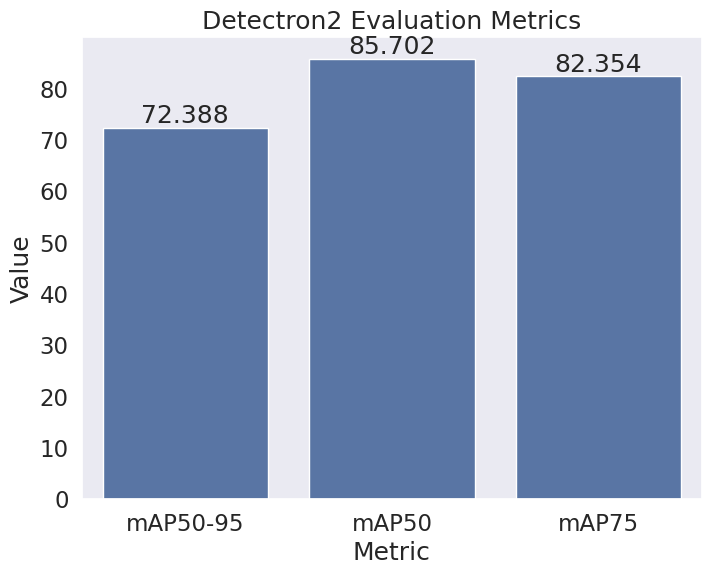

In [ ]:
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[coco_inference['bbox']['AP'], coco_inference['bbox']['AP50'], coco_inference['bbox']['AP75']])

ax.set_title('Detectron2 Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

fig = plt.gcf()
fig.set_size_inches(8, 6)

for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

plt.show()

In [ ]:
coco_inf_dict = coco_inference['bbox'].copy()
delete = []
for i in coco_inf_dict.keys():
  if i.split("-")[0] != 'AP':
    delete.append(i)
delete.append('AP')
for i in delete:
  del coco_inf_dict[i]

<ipython-input-12-03b76d5ef7a1>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


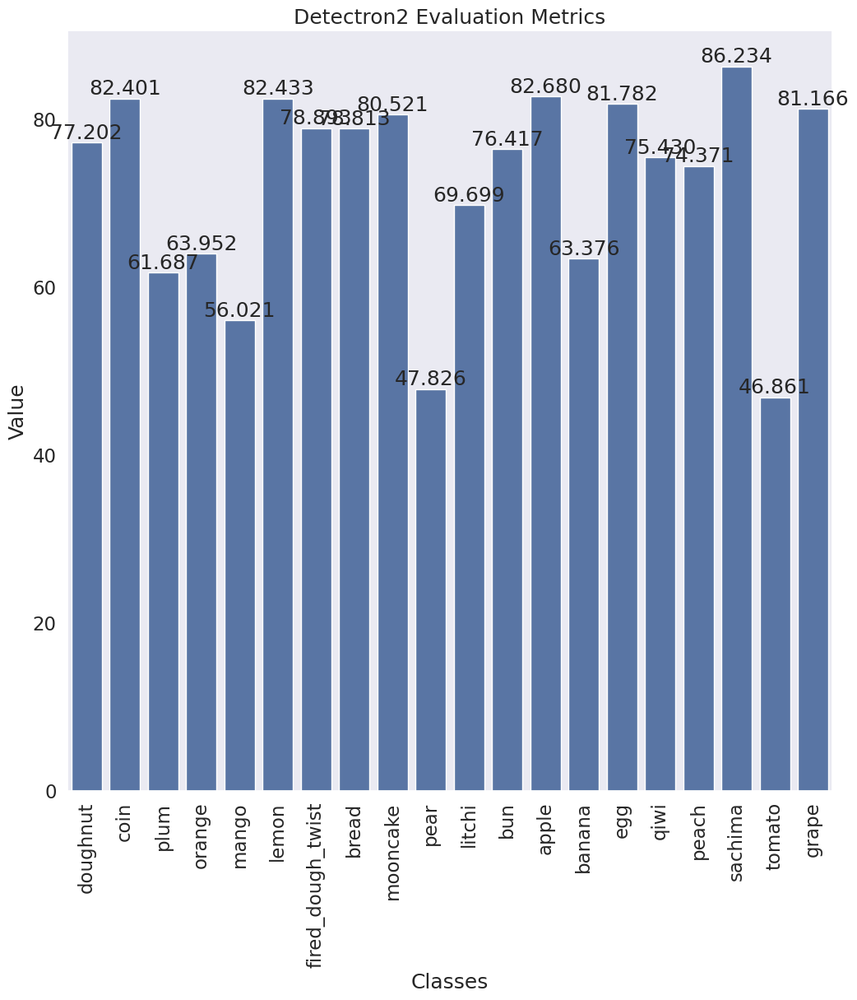

In [ ]:
classes = ['doughnut','coin','plum','orange','mango','lemon',
        'fired_dough_twist','bread','mooncake','pear',
        'litchi','bun','apple','banana','egg','qiwi',
        'peach','sachima','tomato','grape']

ax = sns.barplot(x=[cls for cls in classes], y=[map for map in coco_inf_dict.values()])

ax.set_title('Detectron2 Evaluation Metrics')
ax.set_xlabel('Classes')
ax.set_ylabel('Value')

fig = plt.gcf()
fig.set_size_inches(12, 12)

for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.show()


Now we run validation on the test set.

 We are using the same COCO evaluator on the test set as we did on the validation set, as we want to see the results metrics, and just using inference doesn't provide it.

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_test1", output_dir="/content/drive/MyDrive/ColabNotebooks/models/Detectron2_Models/final1/output")
val_loader = build_detection_test_loader(cfg, "my_dataset_test1")
coco_inference = inference_on_dataset(predictor.model, val_loader, evaluator)
print(coco_inference)

[02/10 16:30:33 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [02/10 16:30:34 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/10 16:30:34 d2.data.datasets.coco]: Loaded 200 images in COCO format from /content/drive/MyDrive/dataset_augmented/test/Test.json
[02/10 16:30:34 d2.data.build]: Distribution of instances among all 20 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   doughnut    | 10           |    coin    | 200          |    plum    | 10           |
|    orange     | 12           |   mango    | 12           |   lemon    | 16           |
| fired_dough.. | 10           |   bread    | 10           |  mooncake  | 10           |
|     pear      | 12           |   litchi   | 10           |    bun     | 10           

Looks like we are doing great, but since the results are averaged - AP is the regular way to quantify object detection, and is a bit different from our normal matrices, we want to see the regular heatmap:

In [ ]:
#from https://stackoverflow.com/questions/71475164/build-confusion-matrix-for-instance-segmantation-mask-r-cnn-from-detectron2/76037309#76037309
import pandas as pd
import torch
from detectron2.structures import Boxes, pairwise_iou

def coco_bbox_to_coordinates(bbox):
    out = bbox.copy().astype(float)
    out[:, 2] = bbox[:, 0] + bbox[:, 2]
    out[:, 3] = bbox[:, 1] + bbox[:, 3]
    return out

def conf_matrix_calc(labels, detections, n_classes, conf_thresh, iou_thresh):
    confusion_matrix = np.zeros([n_classes , n_classes ])
    l_classes = np.array(labels)[:, 0].astype(int)
    l_bboxs = coco_bbox_to_coordinates((np.array(labels)[:, 1:]))
    d_confs = np.array(detections)[:, 4]
    d_bboxs = (np.array(detections)[:, :4])
    d_classes = np.array(detections)[:, -1].astype(int)
    detections = detections[np.where(d_confs > conf_thresh)]
    labels_detected = np.zeros(len(labels))
    detections_matched = np.zeros(len(detections))
    for l_idx, (l_class, l_bbox) in enumerate(zip(l_classes, l_bboxs)):
        for d_idx, (d_bbox, d_class) in enumerate(zip(d_bboxs, d_classes)):
            iou = pairwise_iou(Boxes(torch.from_numpy(np.array([l_bbox]))), Boxes(torch.from_numpy(np.array([d_bbox]))))
            if iou >= iou_thresh:
                confusion_matrix[l_class, d_class] += 1
                labels_detected[l_idx] = 1
                detections_matched[d_idx] = 1
    for i in np.where(labels_detected == 0)[0]:
        confusion_matrix[l_classes[i], -1] += 1
    for i in np.where(detections_matched == 0)[0]:
        confusion_matrix[-1, d_classes[i]] += 1
    return confusion_matrix

n_classes = 20
confusion_matrix = np.zeros([n_classes , n_classes])
for d in test_dataset_dicts:
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    labels = list()
    detections = list()
    for coord, conf, cls, ann in zip(
        outputs["instances"].get("pred_boxes").tensor.cpu().numpy(),
        outputs["instances"].get("scores").cpu().numpy(),
        outputs["instances"].get("pred_classes").cpu().numpy(),
        d["annotations"]
    ):
        labels.append([ann["category_id"]] + ann["bbox"])
        detections.append(list(coord) + [conf] + [cls])
    confusion_matrix += conf_matrix_calc(np.array(labels), np.array(detections), n_classes, conf_thresh=0.5, iou_thresh=0.5)
matrix_indexes = test_metadata.get("thing_classes")
cm = pd.DataFrame(confusion_matrix, columns=matrix_indexes, index=matrix_indexes)
cm_no_coin = cm.copy()
cm_no_coin.drop('coin', axis=1, inplace=True)
cm_no_coin.drop('coin', axis=0, inplace=True)


We dropped the coin detection from the heatmap for better understanding of the results:

<Axes: >

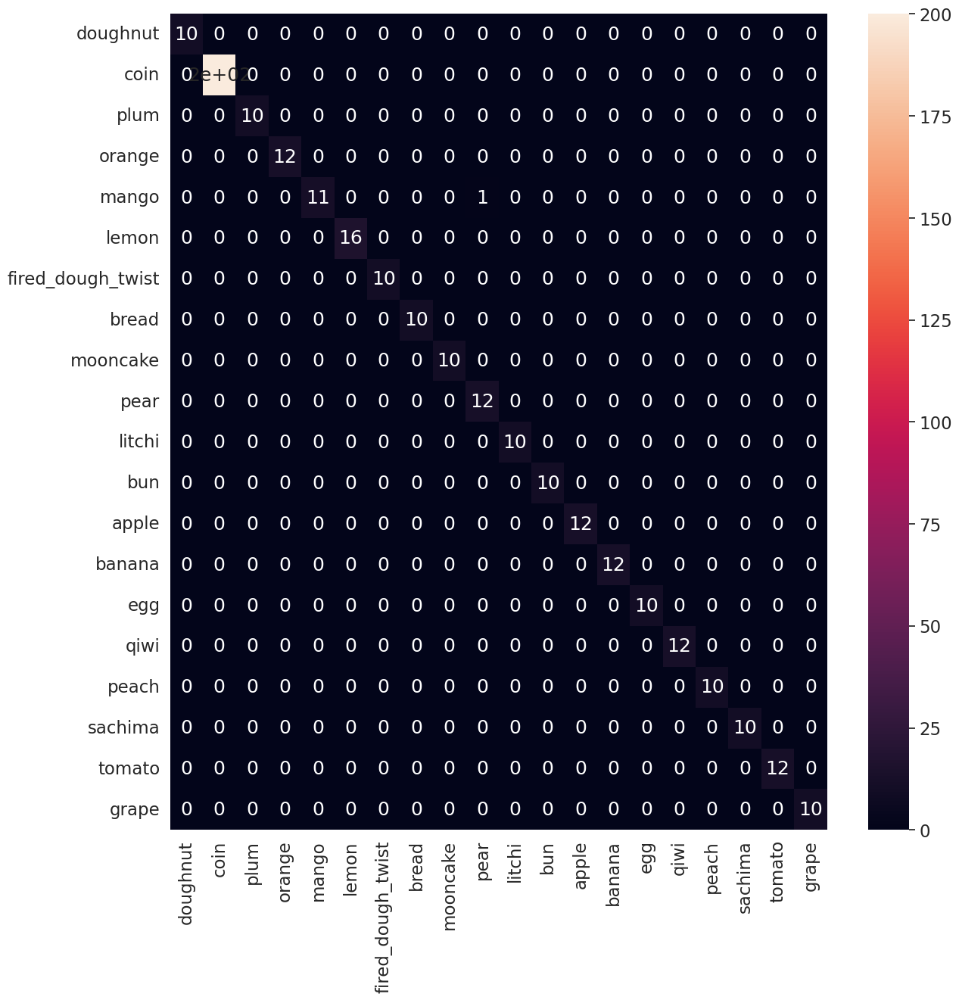

In [ ]:
plt.figure(figsize=(14, 14))
sns.heatmap(cm, annot=True, xticklabels=True, yticklabels=True)

<Axes: >

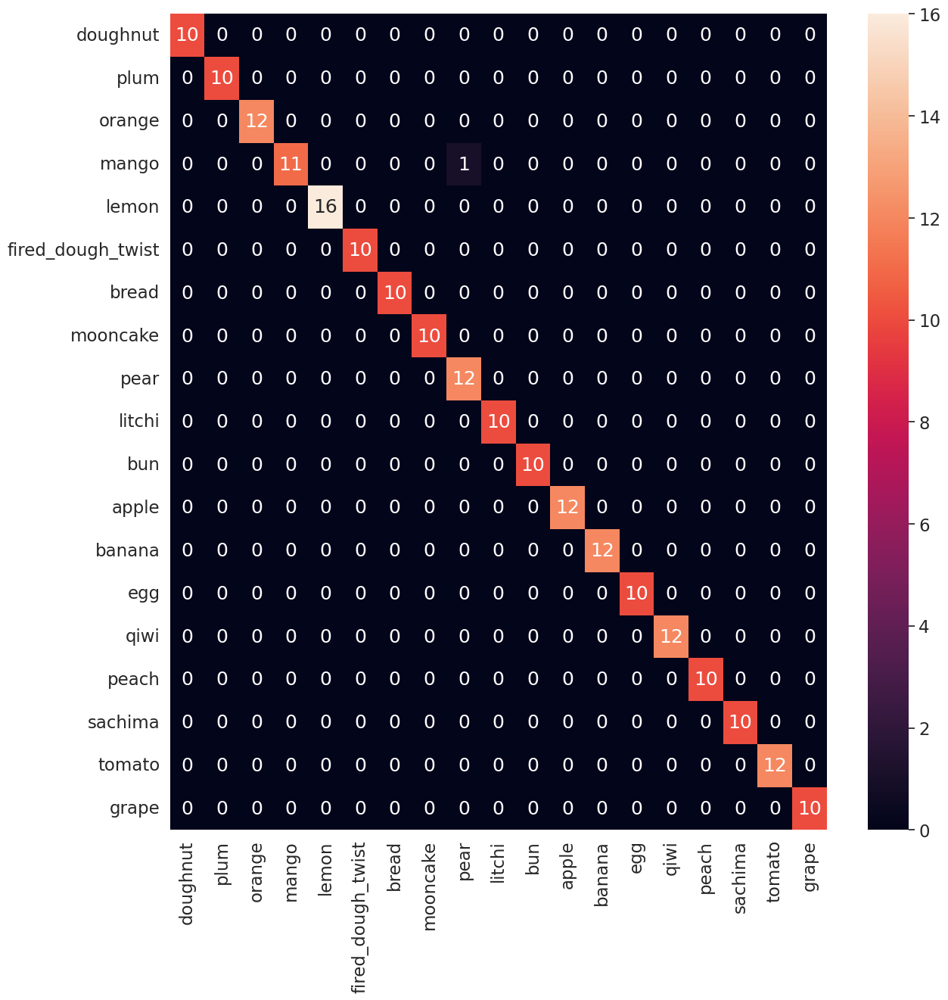

In [ ]:
plt.figure(figsize=(14, 14))
sns.heatmap(cm_no_coin, annot=True, xticklabels=True, yticklabels=True)

Looks like our predictor is doing a great job, with 99.5% accuracy. we only mislabeled pear/mango (once)

In [ ]:
with open('/content/drive/MyDrive/ColabNotebooks/models/det2_val_res.pkl', 'wb') as f:
    pickle.dump([coco_inference, cm], f)

Now let's look at the mAP's metrics:

In [ ]:
import pickle
with open('/content/drive/MyDrive/ColabNotebooks/models/det2_val_res.pkl', 'rb') as f:
    coco_inference = pickle.load(f)

In [ ]:
coco_inf_dict = coco_inference[0]['bbox'].copy()

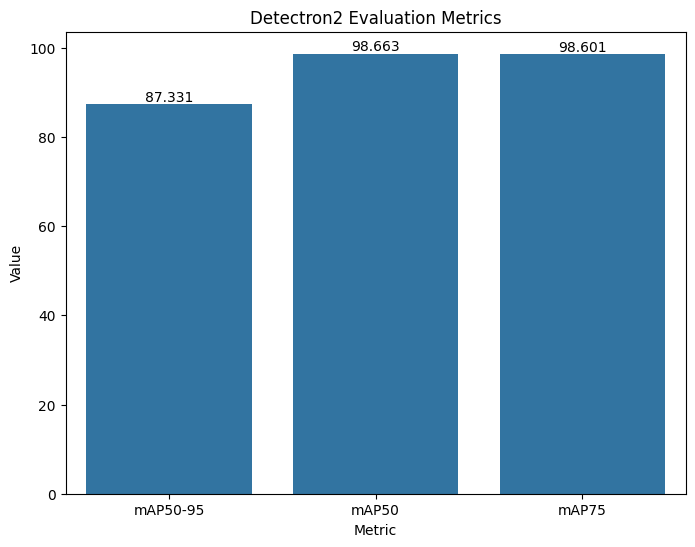

In [ ]:
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[coco_inference[0]['bbox']['AP'], coco_inference[0]['bbox']['AP50'], coco_inference[0]['bbox']['AP75']])

ax.set_title('Detectron2 Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

fig = plt.gcf()
fig.set_size_inches(8, 6)

for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

plt.show()

In [ ]:
coco_inf_dict = coco_inference[0]['bbox'].copy()
delete = []
for i in coco_inf_dict.keys():
  if i.split("-")[0] != 'AP':
    delete.append(i)
delete.append('AP')
for i in delete:
  del coco_inf_dict[i]

<ipython-input-101-03b76d5ef7a1>:18: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


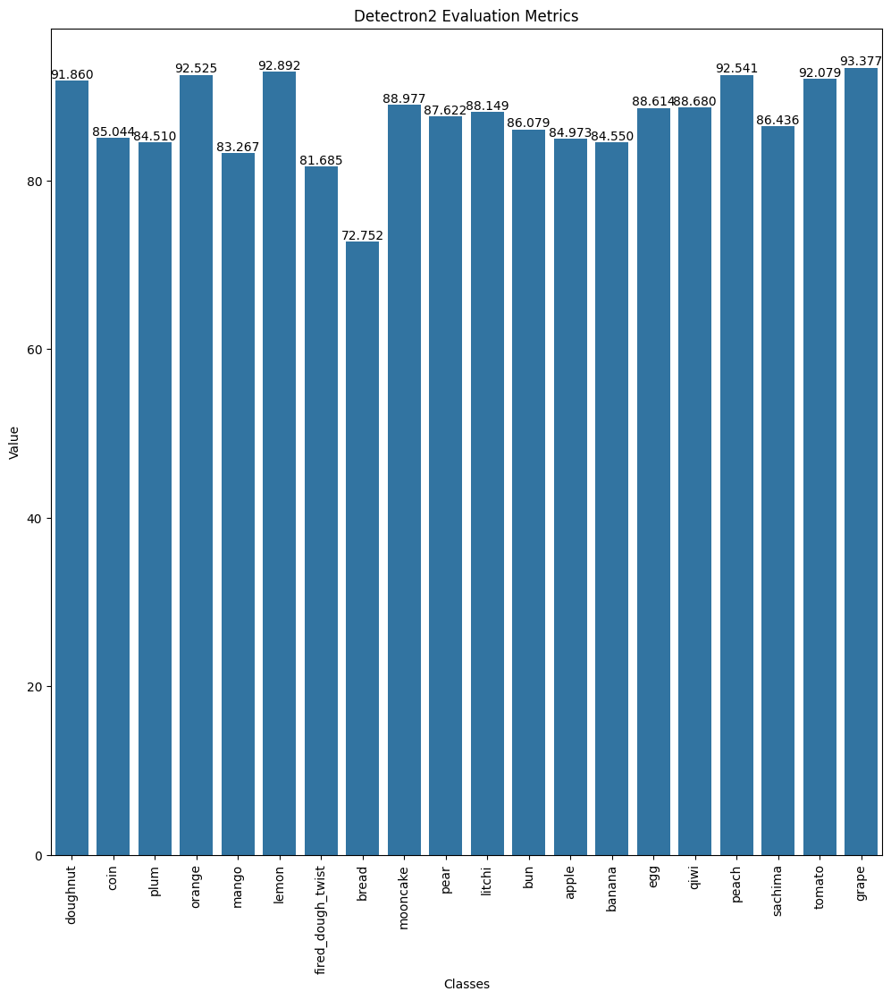

In [ ]:
classes = ['doughnut','coin','plum','orange','mango','lemon',
        'fired_dough_twist','bread','mooncake','pear',
        'litchi','bun','apple','banana','egg','qiwi',
        'peach','sachima','tomato','grape']

ax = sns.barplot(x=[cls for cls in classes], y=[map for map in coco_inf_dict.values()])

ax.set_title('Detectron2 Evaluation Metrics')
ax.set_xlabel('Classes')
ax.set_ylabel('Value')

fig = plt.gcf()
fig.set_size_inches(12, 12)

for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.show()


Now we write our predicted images with their respective bounding boxes to disk and load the paths, predictions and predicted bboxes into a csv file.

In [ ]:
import csv
import datetime
start = datetime.datetime.now()

input_images_directory = "/content/drive/MyDrive/dataset_augmented/test/"

output_directory = "/content/drive/MyDrive/res/Detectron2_test_results/"
if not os.path.exists(output_directory):
  os.mkdir(output_directory)

output_csv_path = output_directory + "output_objects_detectron2.csv"

with open(output_csv_path, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)

    csvwriter.writerow(["image","image_with_preds","og_class", "pred_class", "pred_bbox"])

    for count, image_filename in enumerate(os.listdir(input_images_directory)):
      image_path = os.path.join(input_images_directory, image_filename)
      new_im = cv2.imread(image_path)
      if (image_path) == "/content/drive/MyDrive/dataset_augmented/test/Test.json":
        continue
      image_path = os.path.join(input_images_directory, image_filename)
      new_im = cv2.imread(image_path)
      outputs = predictor(new_im)  # Format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
      v = Visualizer(new_im[:, :, ::-1], metadata=test_metadata)
      out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
      class_labels = outputs["instances"].pred_classes.to("cpu").numpy()
      bounding_box = outputs["instances"].pred_boxes
      class_name = []
      for i in range(len(bounding_box)):
          if i < len(class_labels):
              class_label = class_labels[i]
              class_name.append(test_metadata.thing_classes[class_label])
      with open("/content/drive/MyDrive/dataset_augmented/test/Test.json","r") as f:
        data = json.load(f)
      for im in data["images"]:
        if im["file_name"] == image_filename:
          idx = im["id"]
      og_class = []
      for im in data["annotations"]:
        if im["image_id"] == idx:
          og_class.append(test_metadata.thing_classes[im["category_id"]])

      result_filename = os.path.splitext(image_filename)[0] + "-detectron2-result.jpg"

      output_path = os.path.join(output_directory, result_filename)
      csvwriter.writerow([input_images_directory + image_filename,output_path, og_class, class_name, bounding_box])
      cv2.imwrite(output_path, out.get_image()[:, :, ::-1])
      if count%20 == 0:
        print("Predicted ",count, " images.")

print("Test images completed.")
end = datetime.datetime.now()
print("Total execution time with of prediction with Detectron2 is: ", end-start)



Predicted  0  images.
Predicted  20  images.
Predicted  40  images.
Predicted  60  images.
Predicted  80  images.
Predicted  100  images.
Predicted  120  images.
Predicted  140  images.
Predicted  160  images.
Predicted  180  images.
Test images completed.
Total execution time with of prediction with Detectron2 is:  0:01:19.558646


Let's see how our predictor did on the test set:

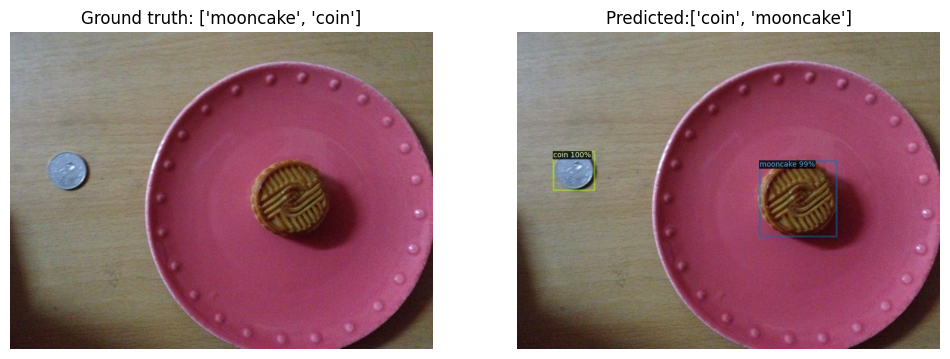

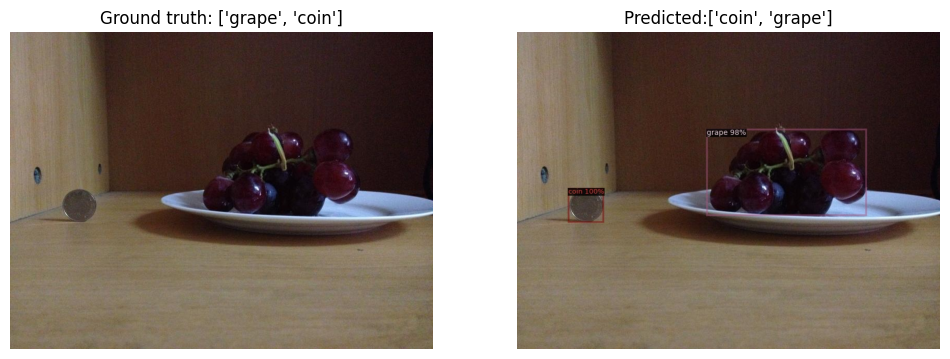

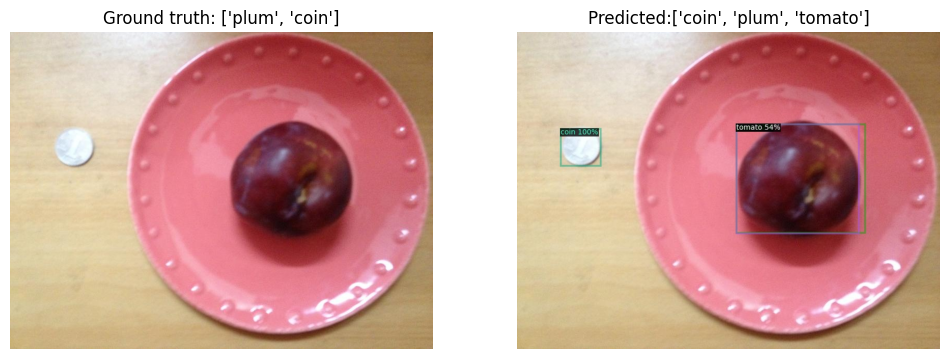

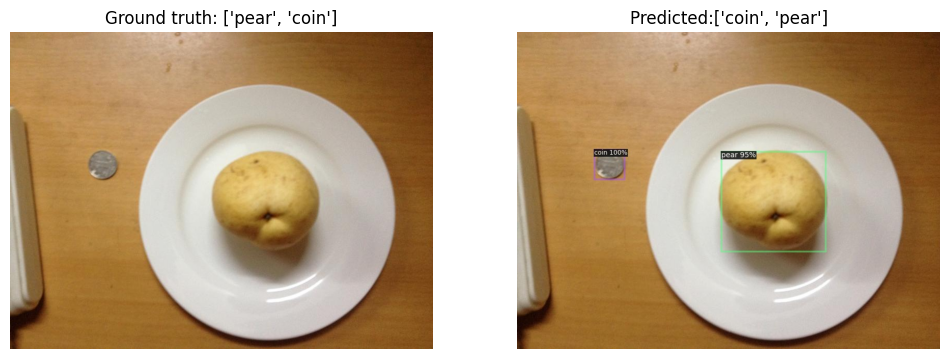

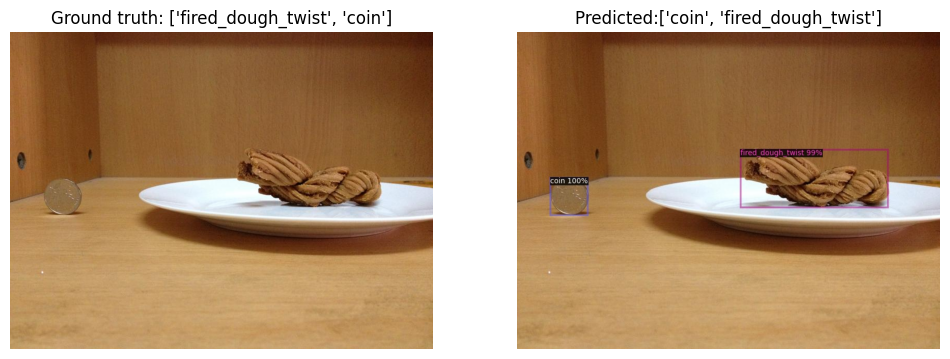

...

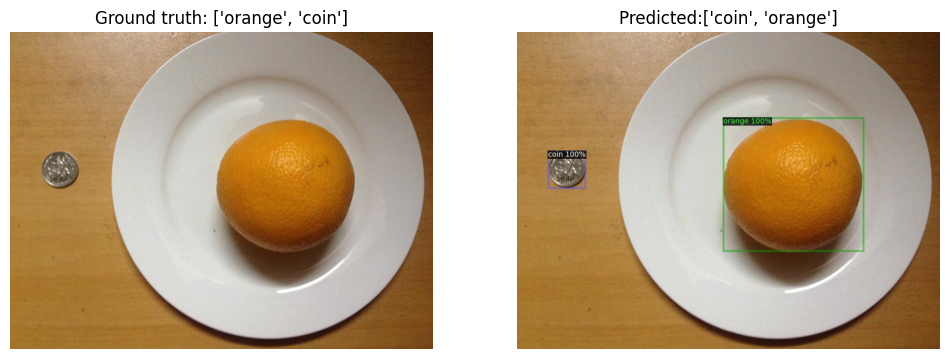

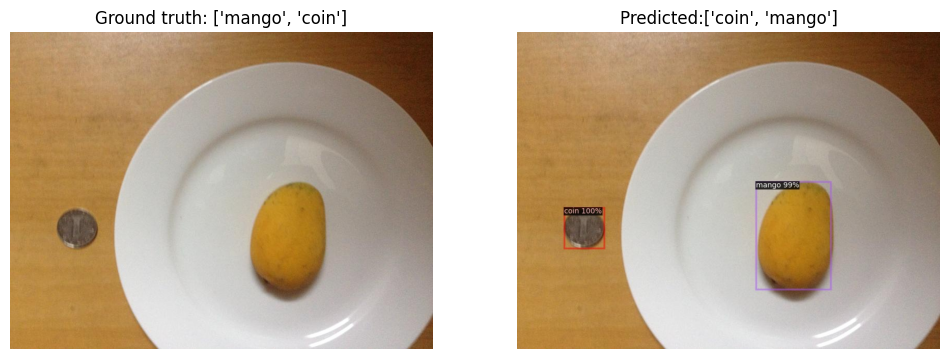

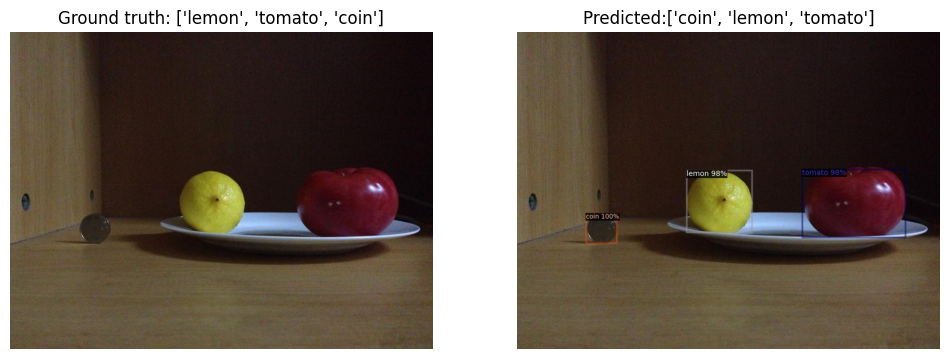

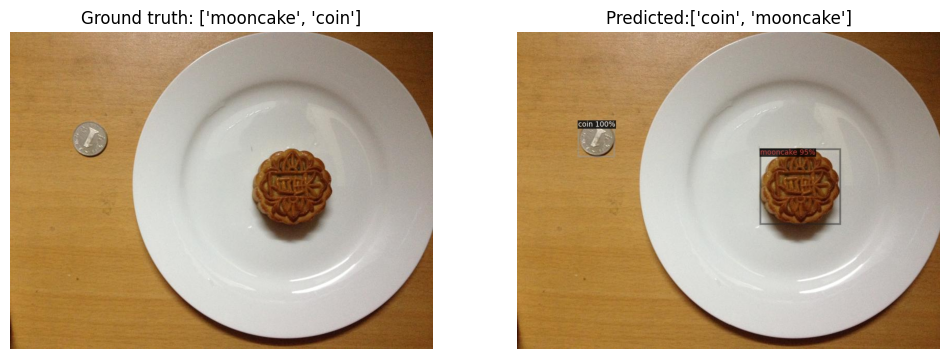

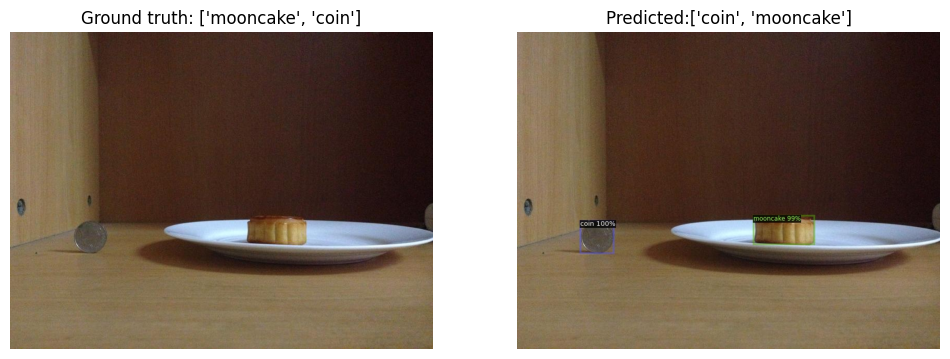

In [ ]:
# Path to the CSV file containing the object-level information
csv_file_path = "/content/drive/MyDrive/res/Detectron2_test_results/output_objects_detectron2.csv"

# Load the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)
for i,d in enumerate(df["image_with_preds"][:20]):    #select number of images for display
    fig, axes = plt.subplots(figsize=(12,12), ncols=2, nrows=1)
    image = cv2.imread(df["image"][i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    label = df["og_class"][i]
    axes[0].imshow(image)
    axes[0].title.set_text('Ground truth: ' + label)
    axes[0].axis('off')
    image = cv2.imread(df["image_with_preds"][i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    label = df["pred_class"][i]
    axes[1].imshow(image)
    axes[1].title.set_text('Predicted:' + label)
    axes[1].axis('off')
    plt.show()

Now we will see some mislabeled images:

['plum', 'coin'] ['coin', 'plum', 'tomato']


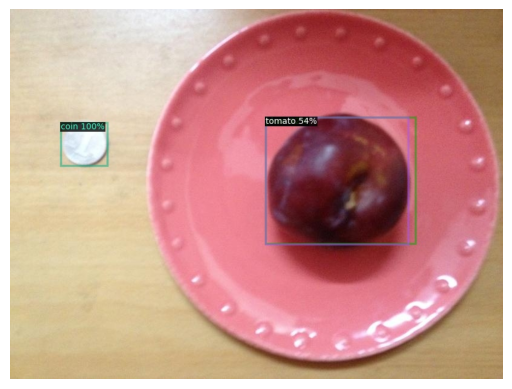

['plum', 'coin'] ['coin', 'plum', 'tomato']


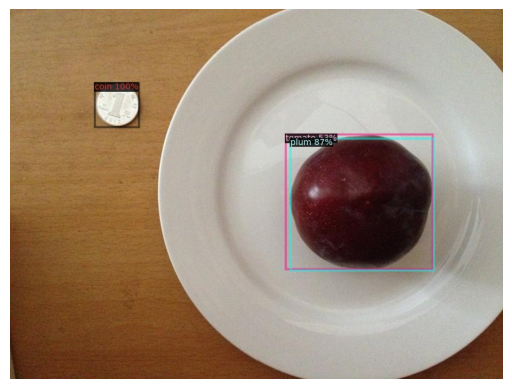

['pear', 'lemon', 'coin'] ['coin', 'pear', 'lemon', 'orange']


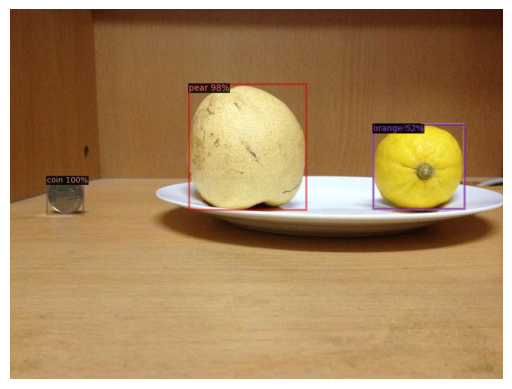

['mango', 'coin'] ['coin', 'pear']


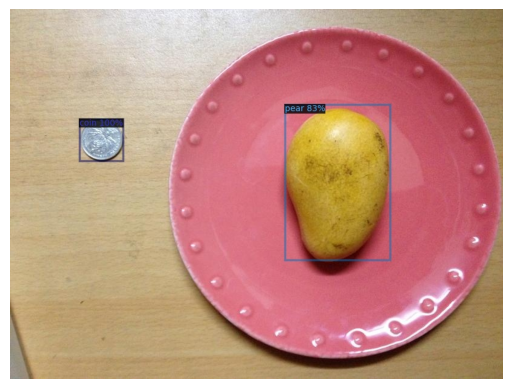

Number of mislabeld images is: 4


In [ ]:
df_det = pd.read_csv("/content/drive/MyDrive/res/Detectron2_test_results/output_objects_detectron2.csv")
count = 0
for index, row in df_det.iterrows():
  if sorted(df_det["og_class"][index]) != sorted(df_det["pred_class"][index]):
    count += 1
    print(df_det["og_class"][index],df_det["pred_class"][index])
    image = cv2.imread(df_det["image_with_preds"][index])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image)
    plt.axis("off")
    plt.show()
print("Number of mislabeled images is:", count)

Looks like our predictor is doing an excellent job on the test set!

We need to note that on the confusion matrix we saw 99.5% accuracy, and here we have 98%, that is because the cm only looked at mislabeled images and not on extra predictions (false positives) like we have here.

We are very happy with our results from Detectron2, not surprising since it is considered a SOTA (state of the art, or one of the very best) model.

time to try the second model: